# Data Analyst Project : Amazon Product Price Sales Dataset

## Important note vefore lokking at my project.
- In order to see the plotly graphs, click this nbviewer link: https://github.com/omarbenavente/Omar_Analytic_Project/blob/main/Amazon%20Product%20Price/Amazon%20Product.ipynb

## Objective
- Find out which type of product is the most popular
- Which price range does people buy the most?
- Looking in more information about the categories
- Finding out which product has the most ratings that has more than 200 number of ratings

## Importing Packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import opendatasets as od
import os
import kaggle
import zipfile
import glob

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)

import plotly.express as px
import plotly.io as pio
pio.renderers.default = "svg"
import cufflinks as cf
cf.go_offline()

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

pd.options.display.float_format = '{:.2f}'.format

## Gathering Data

In [2]:
csv_files = glob.glob(r'/Users/omarbenavente/Downloads/amazon products/*csv')

In [3]:
len(glob.glob(r'/Users/omarbenavente/Downloads/amazon products/*csv'))

140

In [4]:
df = pd.concat([pd.read_csv(f,index_col=False) for f in csv_files])

In [5]:
df.head()

,name,main_category,sub_category,image,link,ratings,no_of_ratings,discount_price,actual_price,Unnamed: 0
0,Skybags Treble-FIFA 68cm Printed Polycarbonate...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/71C5GfgxW2...,https://www.amazon.in/Skybags-Treble-FIFA-Prin...,4.5,2,"₹7,250","₹14,500",NaN
1,Tommy Hilfiger Plastic Hard 66 cms Luggage (89...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/41lIioNQ3N...,https://www.amazon.in/Tommy-Hilfiger-Luggage-8...,3.6,70,"₹6,399","₹7,999",NaN
2,Samsonite Polyester Hard 68 Cms Luggage- Suitc...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/71XSVc5fxg...,https://www.amazon.in/Samsonite-Polyester-Lugg...,4.0,5,"₹12,220","₹18,800",NaN
3,Skybags Polycarbonate Hard 21 Cms Suitcase(_Blue),bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/51euSZMWAn...,https://www.amazon.in/Skybags-Combo-Polycarbon...,4.4,66,"₹6,648","₹10,043.04",NaN
4,Skybags Game-ON FIFA 79cm Printed Polycarbonat...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/710caoNQ4X...,https://www.amazon.in/Skybags-Printed-Polycarb...,4.3,5,"₹6,850","₹17,400",NaN


## Cleaning the Data
- removing unnecessary column
- removing duplicates
- removing unnecessary nulls
- converting columns to its appropriate datatype
- convert rupee to american dollar 

In [6]:
df.shape

(1103170, 10)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1103170 entries, 0 to 1103
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   name            1103170 non-null  object 
 1   main_category   1103170 non-null  object 
 2   sub_category    1103170 non-null  object 
 3   image           1103170 non-null  object 
 4   link            1103170 non-null  object 
 5   ratings         751582 non-null   object 
 6   no_of_ratings   751582 non-null   object 
 7   discount_price  980844 non-null   object 
 8   actual_price    1067544 non-null  object 
 9   Unnamed: 0      551585 non-null   float64
dtypes: float64(1), object(9)
memory usage: 92.6+ MB


In [8]:
df = df.drop('Unnamed: 0',axis=1)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1103170 entries, 0 to 1103
Data columns (total 9 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   name            1103170 non-null  object
 1   main_category   1103170 non-null  object
 2   sub_category    1103170 non-null  object
 3   image           1103170 non-null  object
 4   link            1103170 non-null  object
 5   ratings         751582 non-null   object
 6   no_of_ratings   751582 non-null   object
 7   discount_price  980844 non-null   object
 8   actual_price    1067544 non-null  object
dtypes: object(9)
memory usage: 84.2+ MB


In [10]:
df.duplicated().sum()

533275

In [11]:
df_copy = df.drop_duplicates()

In [12]:
df_copy.isnull().sum()

name                   0
main_category          0
sub_category           0
image                  0
link                   0
ratings           175794
no_of_ratings     175794
discount_price     62194
actual_price       18074
dtype: int64

In [13]:
df_copy.shape

(569895, 9)

In [14]:
df_copy = df_copy.dropna(subset=['ratings','no_of_ratings','actual_price'])

In [15]:
df_copy.isnull().sum()

name                  0
main_category         0
sub_category          0
image                 0
link                  0
ratings               0
no_of_ratings         0
discount_price    29120
actual_price          0
dtype: int64

In [16]:
df_copy.shape

(387079, 9)

In [17]:
df = df_copy

In [18]:
df.info()
# the prices and the ratings should be in numbers, let's check if we can clean this data

<class 'pandas.core.frame.DataFrame'>
Int64Index: 387079 entries, 0 to 43
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   name            387079 non-null  object
 1   main_category   387079 non-null  object
 2   sub_category    387079 non-null  object
 3   image           387079 non-null  object
 4   link            387079 non-null  object
 5   ratings         387079 non-null  object
 6   no_of_ratings   387079 non-null  object
 7   discount_price  357959 non-null  object
 8   actual_price    387079 non-null  object
dtypes: object(9)
memory usage: 29.5+ MB


In [19]:
df['ratings'].unique()
# contains some strings and prices. Let's remove them

array(['4.5', '3.6', '4.0', '4.4', '4.3', '2.8', '3.4', '4.2', '3.7',
       '4.1', '3.9', '4.6', '3.8', 'FREE', '1.0', '3.2', '5.0', '2.5',
       '4.7', '3.3', '3.0', '2.3', '3.5', '1.5', '3.1', '2.9', '2.0',
       '2.6', '2.4', '2.2', '2.7', '4.9', '2.1', '4.8', 'Get', '1.8',
       '1.4', '1.3', 3.9, 4.1, 4.0, 5.0, 3.6, 3.8, 3.7, 4.9, 4.4, 2.8,
       4.3, 4.2, 4.7, 3.5, 3.3, 4.5, 3.4, 4.6, 2.9, 3.1, 1.0, 2.0, 3.0,
       4.8, 3.2, 2.6, 1.5, 2.7, 2.4, 2.5, 2.2, 1.9, 2.3, '1.6', '1.9',
       '1.7', '₹70', '1.2', '₹99', '₹2.99', 1.7, 1.6, 1.8, 1.4, 1.3, 2.1,
       '₹68.99', '₹65', '₹100', '1.1'], dtype=object)

In [20]:
df = df[~df['ratings'].isin(['FREE','₹70','₹99', '₹2.99','Get','₹68.99', '₹65', '₹100'])]
# removing the string

In [21]:
df['ratings'].unique()

array(['4.5', '3.6', '4.0', '4.4', '4.3', '2.8', '3.4', '4.2', '3.7',
       '4.1', '3.9', '4.6', '3.8', '1.0', '3.2', '5.0', '2.5', '4.7',
       '3.3', '3.0', '2.3', '3.5', '1.5', '3.1', '2.9', '2.0', '2.6',
       '2.4', '2.2', '2.7', '4.9', '2.1', '4.8', '1.8', '1.4', '1.3', 3.9,
       4.1, 4.0, 5.0, 3.6, 3.8, 3.7, 4.9, 4.4, 2.8, 4.3, 4.2, 4.7, 3.5,
       3.3, 4.5, 3.4, 4.6, 2.9, 3.1, 1.0, 2.0, 3.0, 4.8, 3.2, 2.6, 1.5,
       2.7, 2.4, 2.5, 2.2, 1.9, 2.3, '1.6', '1.9', '1.7', '1.2', 1.7, 1.6,
       1.8, 1.4, 1.3, 2.1, '1.1'], dtype=object)

In [22]:
df['ratings'] = df['ratings'].astype('float64')
#converting it to float

In [23]:
df.shape

(380846, 9)

In [24]:
df.isnull().sum()

name                  0
main_category         0
sub_category          0
image                 0
link                  0
ratings               0
no_of_ratings         0
discount_price    28604
actual_price          0
dtype: int64

In [25]:
df.duplicated().sum()

17993

In [26]:
df['no_of_ratings'] = df['no_of_ratings'].str.replace(',','')

In [27]:
df.isnull().sum()

name                  0
main_category         0
sub_category          0
image                 0
link                  0
ratings               0
no_of_ratings        56
discount_price    28604
actual_price          0
dtype: int64

In [28]:
df['no_of_ratings'] = df['no_of_ratings'].astype('float64')

In [29]:
df.head()

,name,main_category,sub_category,image,link,ratings,no_of_ratings,discount_price,actual_price
0,Skybags Treble-FIFA 68cm Printed Polycarbonate...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/71C5GfgxW2...,https://www.amazon.in/Skybags-Treble-FIFA-Prin...,4.50,2.00,"₹7,250","₹14,500"
1,Tommy Hilfiger Plastic Hard 66 cms Luggage (89...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/41lIioNQ3N...,https://www.amazon.in/Tommy-Hilfiger-Luggage-8...,3.60,70.00,"₹6,399","₹7,999"
2,Samsonite Polyester Hard 68 Cms Luggage- Suitc...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/71XSVc5fxg...,https://www.amazon.in/Samsonite-Polyester-Lugg...,4.00,5.00,"₹12,220","₹18,800"
3,Skybags Polycarbonate Hard 21 Cms Suitcase(_Blue),bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/51euSZMWAn...,https://www.amazon.in/Skybags-Combo-Polycarbon...,4.40,66.00,"₹6,648","₹10,043.04"
4,Skybags Game-ON FIFA 79cm Printed Polycarbonat...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/710caoNQ4X...,https://www.amazon.in/Skybags-Printed-Polycarb...,4.30,5.00,"₹6,850","₹17,400"


In [30]:
df['discount_price']

0      ₹7,250
1      ₹6,399
2     ₹12,220
3      ₹6,648
4      ₹6,850
       ...   
38        NaN
39        NaN
40        NaN
41        NaN
43        NaN
Name: discount_price, Length: 380846, dtype: object

In [31]:
# prices have the rupee sign and comma in the column. Python doesn't count those as integers
# removing rupee sign and comma to convert this into a float
# calcuate from rupee to american dollars
df['discount_price'] = df['discount_price'].str.replace('₹','').str.replace(',','').astype('float64') * 0.012
df['actual_price'] = df['actual_price'].str.replace('₹','').str.replace(',','').astype('float64') * 0.012

In [32]:
df.head()

,name,main_category,sub_category,image,link,ratings,no_of_ratings,discount_price,actual_price
0,Skybags Treble-FIFA 68cm Printed Polycarbonate...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/71C5GfgxW2...,https://www.amazon.in/Skybags-Treble-FIFA-Prin...,4.50,2.00,87.00,174.00
1,Tommy Hilfiger Plastic Hard 66 cms Luggage (89...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/41lIioNQ3N...,https://www.amazon.in/Tommy-Hilfiger-Luggage-8...,3.60,70.00,76.79,95.99
2,Samsonite Polyester Hard 68 Cms Luggage- Suitc...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/71XSVc5fxg...,https://www.amazon.in/Samsonite-Polyester-Lugg...,4.00,5.00,146.64,225.60
3,Skybags Polycarbonate Hard 21 Cms Suitcase(_Blue),bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/51euSZMWAn...,https://www.amazon.in/Skybags-Combo-Polycarbon...,4.40,66.00,79.78,120.52
4,Skybags Game-ON FIFA 79cm Printed Polycarbonat...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/710caoNQ4X...,https://www.amazon.in/Skybags-Printed-Polycarb...,4.30,5.00,82.20,208.80


In [33]:
#checking if we need to get rid of the nulls
# we don't need to remove the nulls from the discount price since having a null means that they were no discounts applied to that product
df.isnull().sum()

name                  0
main_category         0
sub_category          0
image                 0
link                  0
ratings               0
no_of_ratings        56
discount_price    28604
actual_price          0
dtype: int64

In [34]:
df = df.dropna(subset=['no_of_ratings'])

In [35]:
df['no_of_ratings'] = df['no_of_ratings'].astype('int64')

In [36]:
df.duplicated().sum()
# rechecking if there's any duplicates that can be an issue
# even though we cleared the duplicates early on, they were some duplicates leftover

17993

In [37]:
df = df.drop_duplicates()
# dropping the duplicates

In [38]:
df.duplicated().sum()
#checking if there's anymore duplicates

0

## Exploratory Data Analysis
- Let's do some exploring and visualizing the data we have
### Questions
1. What are the top 5 expensive items of the actual price and net price? If the price is way high, show the no_of_ratings to see if this item is legit or not
2. Which price range is the most common for actual price and discount price?
3. What are the top 10 most popular main categories?
4. What are the top 10 most popular sub categories?
5. What are the top 10 main categories regarding to have the most sales in discounted price?
6. Which product has the highest ratings that has the number of ratings greater than 200? If ratings are tied? which product has the highest number of ratings

In [39]:
df.describe()
# doing some more analyzing to see something interesting.

,ratings,no_of_ratings,discount_price,actual_price
count,362797.00,362797.00,334963.00,362797.00
mean,3.83,834.99,21.11,370.57
std,0.75,8608.78,76.73,197238.99
min,1.00,1.00,0.10,0.00
25%,3.50,4.00,4.31,10.79
50%,3.90,20.00,7.19,17.99
75%,4.30,133.00,14.39,34.80
max,5.00,589547.00,14999.88,118799999.99


### Question 1

In [40]:
df[['name','no_of_ratings','discount_price']].sort_values(by = 'discount_price',ascending=False).head()

,name,no_of_ratings,discount_price
584,Samsung 214 cm (85 inches) 8K Ultra HD Smart N...,10,14999.88
373,Sony Bravia 195 cm (77 inches) XR Series 4K Ul...,439,5471.88
577,Samsung 189 cm (75 inches) 4K Ultra HD Smart N...,18,4919.88
73356,Canon EOS 5D Mark IV 30.4 MP Digital SLR Camer...,125,4463.76
380,Sony Bravia 164 cm (65 inches) XR Series 4K Ul...,44,3875.88


- Samsung 85 inch 8k tv is the most expensive item listed on amazon. The rest are more TVs with one high quality camera

In [41]:
df[['name','no_of_ratings','actual_price']].sort_values(by = 'actual_price',ascending=False).head()

,name,no_of_ratings,actual_price
853,"Marutivilla Insect Killer, Mosquito Killer Lig...",1,118799999.99
351,Clovia Women's Activewear Ankle Length Printed...,4,732995.88
584,Samsung 214 cm (85 inches) 8K Ultra HD Smart N...,10,19138.80
886,Sri Jagdamba Pearls 10 Gm 24kt (999) Yellow Go...,4,8403.60
373,Sony Bravia 195 cm (77 inches) XR Series 4K Ul...,439,8398.80


- An insect killer and women's active wear cost more that 700,000 dollars? 
- I would assume that there was a mistake of putting that actual price for items that should be in between 15 - 30 dollars
- Realistically, Samsung 85 inch 8k TV is also the most expensive item on the actual price.

### Question 2

In [42]:
df['discount_price'].iplot(kind = 'hist',bins = 5000, colors = 'blue',xTitle = 'Discount Price')

# since there's a lot of bins, if you zoom further in where the x axis is between 0 and 500, you'll see the most common prices
# $0-5 has over 108,423
# $5-10 has over 104,395
# low prices between $0-25 people ususally byes on amazon, since amazon is well known on selling accessories

- As you zoom in further to the left, the most common range of discount price is 0-5 dollars with over 108,423 follow up by 5-10 dollars with over 104,395
- People ususally buy the price between 0-25 dollars

In [43]:
# taking out the 2 most expsensive product, because it will mess up the histogram
df[df['actual_price'] < 700000]['actual_price'].iplot(kind = 'hist',bins = 5000, colors = 'blue', xTitle = 'Actual Price')

# $7.50 and 12.50 is the most common price with 78,908
# similary prices between $2.50 and $62.50

- As you zoom in further to the left, 7.50 and 12.50 dollars is the most common price with 78,908
- Overall, customers purchase prices between 2.50 and 62.50 dollars

### Question 3

In [44]:
df_gb = df.groupby('main_category').count()['name'].reset_index().sort_values(by = 'name',ascending=False).rename(columns={'name':'count'}).head(10)

<Figure size 1500x600 with 0 Axes>

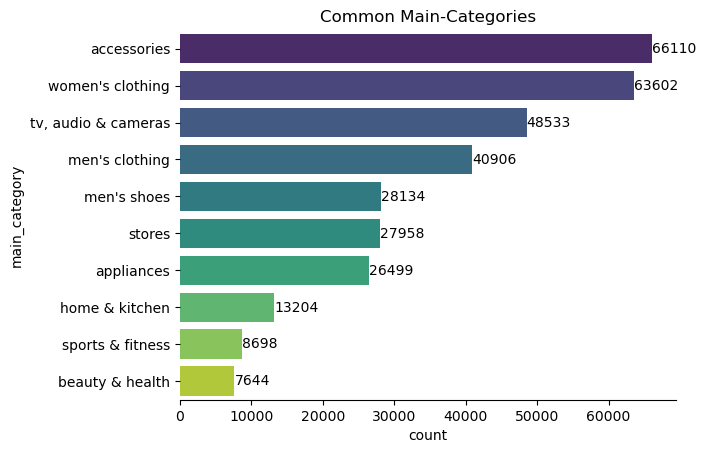

<Figure size 1500x600 with 0 Axes>

In [45]:
ax = sns.barplot(x = 'count',y = 'main_category',data = df_gb,
                 palette='viridis')

for i in ax.containers:
    ax.bar_label(i,)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
plt.title('Common Main-Categories')
plt.figure(figsize=(15,6))

- Accessories and women's clothings are the most common categories people tend to purchase
- Accessories makes sense since they provide lots of discounts for a good price, as well as clothings for the same reason as accessories.

### Question 4

In [46]:
df_gb_sc = df.groupby('sub_category').count()['name'].reset_index().sort_values(by = 'name',ascending=False).rename(columns={'name':'count'}).head(10)

<Figure size 1500x600 with 0 Axes>

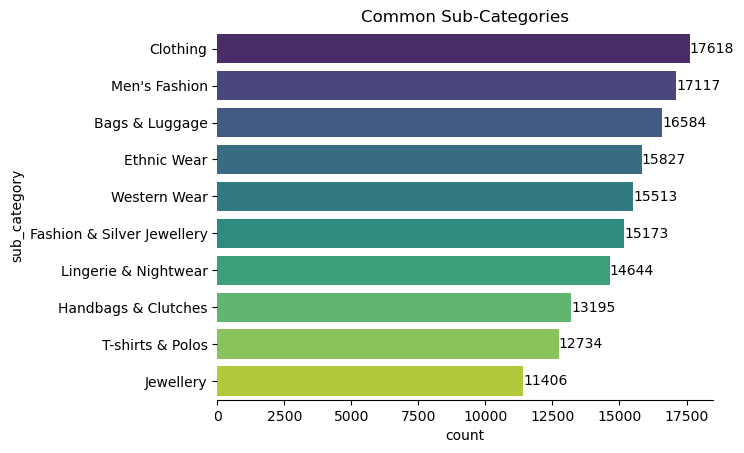

<Figure size 1500x600 with 0 Axes>

In [47]:
ax = sns.barplot(x = 'count',y = 'sub_category',data = df_gb_sc,
                 palette='viridis')

for i in ax.containers:
    ax.bar_label(i,)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
plt.title('Common Sub-Categories')
plt.figure(figsize=(15,6))

- It's intersting that all clothings and fashion accessories took over the top 10 most common sub-cateorgies.
- We get to know more that People mostly show for clothes more than electronic accessories.

In [48]:
df_gb_sum = df.groupby('main_category').sum()['discount_price'].reset_index().sort_values(by = 'discount_price',ascending=False).rename(columns={'discount_price':'Total Discount Price'}).head(10)

Text(0.5, 1.0, 'Most Sales in Main Category')

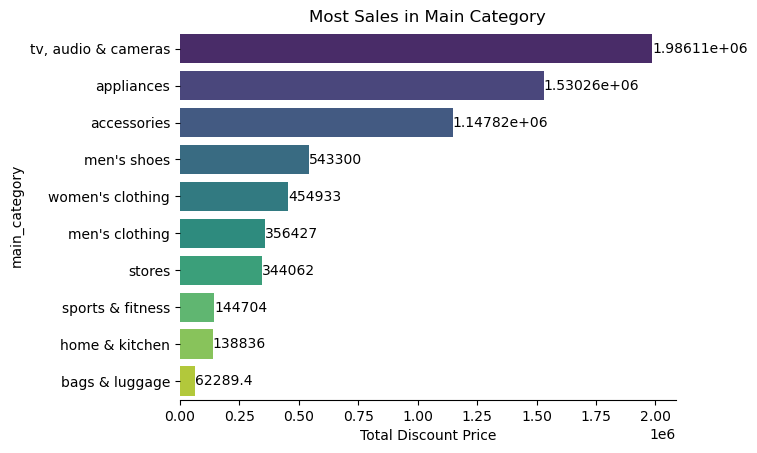

In [49]:
ax = sns.barplot(x = 'Total Discount Price',y = 'main_category',data = df_gb_sum,
                 palette='viridis')

for i in ax.containers:
    ax.bar_label(i,)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    
plt.title('Most Sales in Main Category')

- tv, audio & camera have the most sales since most are expensive and customer purchases these product especially when there's a discount
- Amazon is well known of having a great sales in appliances and accessories since they're afforable and comes in good quality

### Question 6

In [50]:
df.head()

,name,main_category,sub_category,image,link,ratings,no_of_ratings,discount_price,actual_price
0,Skybags Treble-FIFA 68cm Printed Polycarbonate...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/71C5GfgxW2...,https://www.amazon.in/Skybags-Treble-FIFA-Prin...,4.50,2,87.00,174.00
1,Tommy Hilfiger Plastic Hard 66 cms Luggage (89...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/41lIioNQ3N...,https://www.amazon.in/Tommy-Hilfiger-Luggage-8...,3.60,70,76.79,95.99
2,Samsonite Polyester Hard 68 Cms Luggage- Suitc...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/71XSVc5fxg...,https://www.amazon.in/Samsonite-Polyester-Lugg...,4.00,5,146.64,225.60
3,Skybags Polycarbonate Hard 21 Cms Suitcase(_Blue),bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/51euSZMWAn...,https://www.amazon.in/Skybags-Combo-Polycarbon...,4.40,66,79.78,120.52
4,Skybags Game-ON FIFA 79cm Printed Polycarbonat...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/710caoNQ4X...,https://www.amazon.in/Skybags-Printed-Polycarb...,4.30,5,82.20,208.80


In [51]:
df_good_product = df[df['no_of_ratings'] > 200]

In [52]:
df_good_product.head()

,name,main_category,sub_category,image,link,ratings,no_of_ratings,discount_price,actual_price
20,TRUMPKIN / Small Size/Cabin-Luggage/Polyester/...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/I/61ALbO5pEB...,https://www.amazon.in/Polyster-Softside-Small-...,4.00,213,16.00,25.20
56,Nasher Miles Lombard Hard-Side Cabin Luggage|G...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/W/IMAGERENDE...,https://www.amazon.in/Nasher-Miles-Lombard-Gre...,4.20,321,39.59,40.80
74,NOVEX Canyon Check-in Size Soft Sided Polyeste...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/W/IMAGERENDE...,https://www.amazon.in/NOVEX-Polyester-Luggage-...,4.00,308,39.59,107.99
83,AmazonBasics Pyramid Hardside Spinner Luggage ...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/W/IMAGERENDE...,https://www.amazon.in/AmazonBasics-Pyramid-Lug...,4.60,223,25.70,90.00
88,MOKOBARA The Set of Polycarbonate Hardsided Lu...,bags & luggage,Suitcases & Trolley Bags,https://m.media-amazon.com/images/W/IMAGERENDE...,https://www.amazon.in/MOKOBARA-Polycarbonate-H...,4.30,359,221.99,287.99


In [53]:
df_good_product[['name','ratings','no_of_ratings','discount_price','actual_price']].drop_duplicates().sort_values(by = ['ratings','no_of_ratings'],ascending=[False,False]).head(20)

,name,ratings,no_of_ratings,discount_price,actual_price
127564,"Pampers Swaddlers Disposable Baby Diapers, New...",4.90,26160,156.10,223.07
706,"Medela Breastmilk Cooler Set (Multicolour, MED...",4.90,7404,57.77,145.20
128043,"Pampers Diapers Size 4, 150 Count - Pampers Pu...",4.90,6553,240.78,662.40
329,DOWAN multi color Hand Juicer for Fruits and V...,4.90,5485,5.39,59.99
536,Scrub Daddy Instant Portable Water Heater Geys...,4.90,2285,16.79,42.00
127766,"A&D Ointment, Diaper Rash All-Purpose Skincare...",4.90,1853,NaN,102.94
375073,Psalm 46: 10 - Purple Checkbook Cover (9.99),4.90,1158,NaN,35.14
8,"Ravensburger Puzzles No Dogs on The Beach, Mul...",4.90,1012,NaN,43.61
395641,Sennheiser E609 Instrument Microphone-Silver S...,4.90,657,NaN,124.80
794,Galaxy Fusions Silky Smooth Dark Chocolate Pac...,4.90,226,6.91,7.68


- seems like Pampers Swaddlers Disposable Baby Diapers has the higest rating with the highest number of ratings
- Amazon is well represented for having good quality for child care products